# Projected Gradient Descent

PGD is an iterative method that applies the FGSM attack multiple times, each time using the perturbation from the previous step, and projects the perturbation back onto a defined norm ball. This results in a stronger attack.

In [1]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import requests
import matplotlib.pyplot as plt
import numpy as np


In [2]:
!wget -q https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt

In [3]:
model = models.resnet18(pretrained=True).eval()

with open("imagenet_classes.txt") as f:
    labels = [line.strip() for line in f.readlines()]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [4]:
def pgd_attack(model, image, label_idx, epsilon=0.03, alpha=0.005, num_iter=10):
    original = image.clone().detach()
    perturbed = image.clone().detach().requires_grad_(True)

    for i in range(num_iter):
        output = model(perturbed)
        loss = nn.CrossEntropyLoss()(output, torch.tensor([label_idx]))

        model.zero_grad()
        loss.backward()

        with torch.no_grad():
            perturb = alpha * perturbed.grad.sign()
            perturbed = perturbed + perturb

            perturbed = torch.max(torch.min(perturbed, original + epsilon), original - epsilon)
            perturbed = torch.clamp(perturbed, 0, 1)

        perturbed.requires_grad_()

    return perturbed


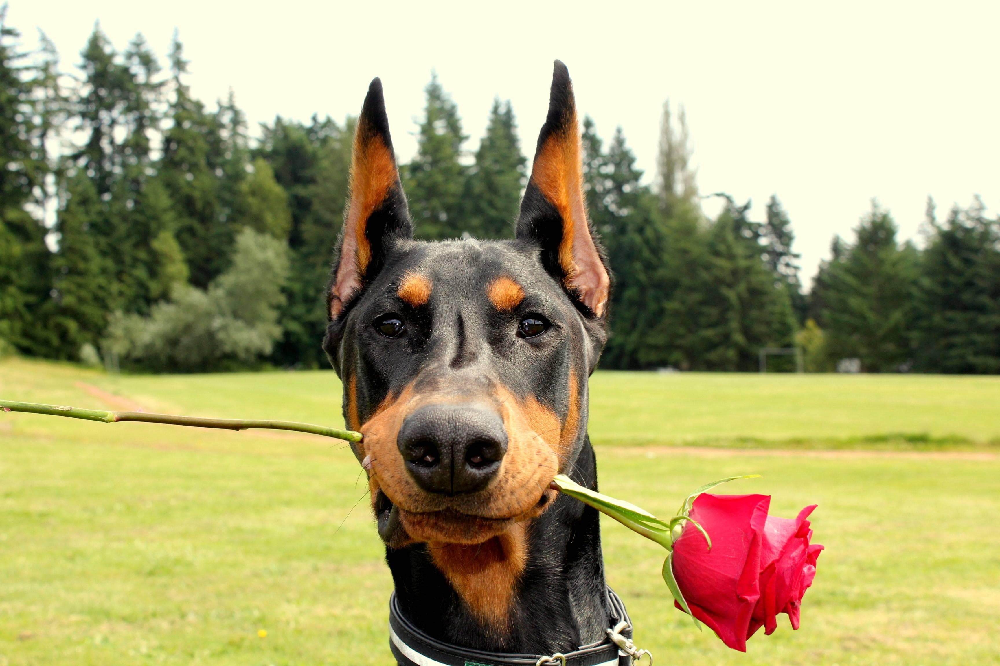

In [5]:
url = "https://imgix.ranker.com/user_node_img/50023/1000440480/original/doberman-with-a-rose-photo-u2"
image = Image.open(requests.get(url, stream=True).raw).convert("RGB")
display(image)



In [6]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
input_tensor = transform(image).unsqueeze(0)

model.eval()
with torch.no_grad():
    output = model(input_tensor)
    label_idx = output.argmax(dim=1).item()
    print(f"Original Prediction: {labels[label_idx]}")

Original Prediction: Doberman


In [7]:
# PGD
pgd_adv = pgd_attack(model, input_tensor, label_idx, epsilon=0.03, alpha=0.005, num_iter=10)

# Predict new class
with torch.no_grad():
    adv_output = model(pgd_adv)
    adv_label = adv_output.argmax(dim=1).item()

print(f"Adversarial Prediction: {labels[adv_label]}")


Adversarial Prediction: pelican


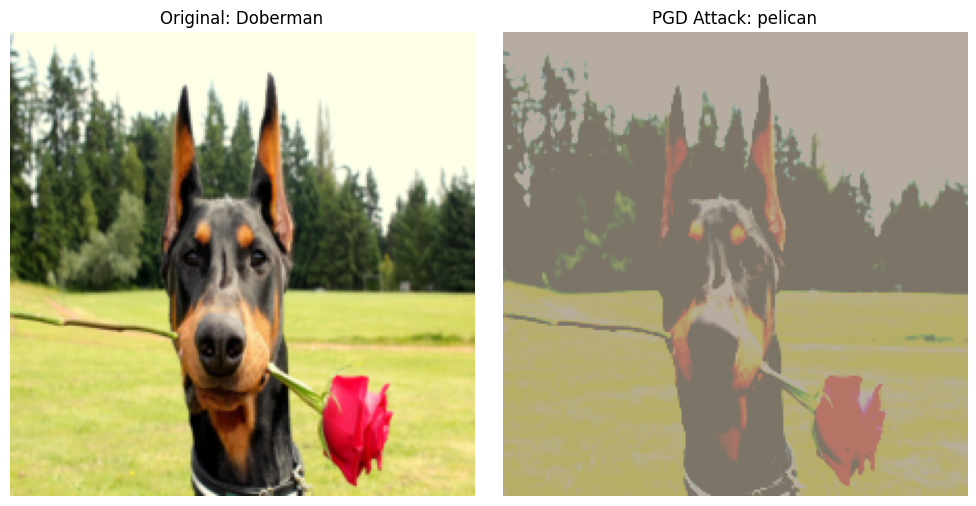

In [8]:
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return torch.clamp(tensor * std + mean, 0, 1)


fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(denormalize(input_tensor.squeeze()).permute(1, 2, 0).numpy())
axs[0].set_title(f"Original: {labels[label_idx]}")
axs[0].axis('off')

axs[1].imshow(denormalize(pgd_adv.squeeze()).permute(1, 2, 0).detach().numpy())
axs[1].set_title(f"PGD Attack: {labels[adv_label]}")
axs[1].axis('off')

plt.tight_layout()
plt.show()


## Gradient Magnitude Map

 We compute the saliency map, which is derived from the gradient of the loss with respect to the input image. The saliency map highlights the most important pixels in the image that contribute to the model's decision. This shows us which pixels to attack


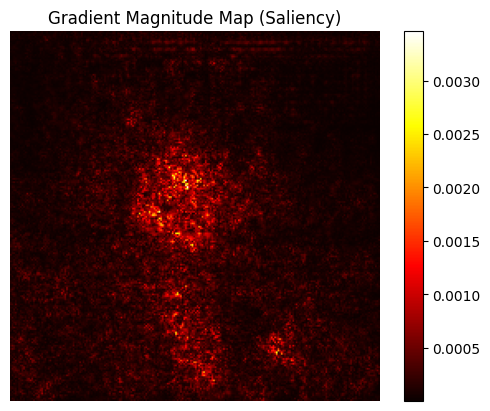

In [9]:
input_tensor.requires_grad = True
output = model(input_tensor)
loss = nn.CrossEntropyLoss()(output, torch.tensor([label_idx]))
model.zero_grad()
loss.backward()

grad = input_tensor.grad.squeeze().abs()
saliency, _ = torch.max(grad, dim=0)

plt.imshow(saliency.numpy(), cmap='hot')
plt.title("Gradient Magnitude Map (Saliency)")
plt.axis('off')
plt.colorbar()
plt.show()


## Per-Channel Perturbation

Per-channel perturbation involves applying separate perturbations to each color channel (R, G, B) of the image. This plot shows how each channel got pertubated

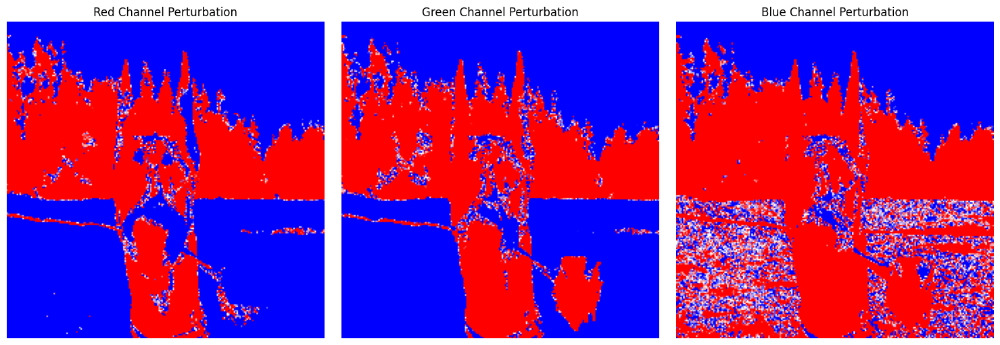

In [10]:
diff = (pgd_adv - input_tensor).squeeze().detach()

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for i, color in enumerate(['Red', 'Green', 'Blue']):
    axs[i].imshow(diff[i].numpy(), cmap='bwr', vmin=-0.03, vmax=0.03)
    axs[i].set_title(f'{color} Channel Perturbation')
    axs[i].axis('off')
plt.tight_layout()
plt.show()
